In [ ]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
sumn2u_riped_and_unriped_tomato_dataset_path = kagglehub.dataset_download('sumn2u/riped-and-unriped-tomato-dataset')

print('Data source import complete.')


Using Colab cache for faster access to the 'riped-and-unriped-tomato-dataset' dataset.
Data source import complete.


## 1. Data Preparation

The given dataset is provided in the following format:

```sh
Riped and Unriped Tomato Dataset/
├── Images/
│   ├── riped_tomato_1.jpeg
│   ├── riped_tomato_10.jpeg
│   ├── riped_tomato_11.jpeg
│   ├── riped_tomato_12.jpeg
│   └── ...
└── Labels/
    ├── riped_tomato_1.txt
    ├── riped_tomato_10.txt
    ├── riped_tomato_11.txt
    ├── riped_tomato_12.txt
    └── ...
```

The recommended format differs from what we have, so we will split the dataset to support the [YOLO fromat](https://docs.ultralytics.com/datasets/detect/#ultralytics-yolo-format). For this, we will import some libraries.


In [ ]:
import os
import shutil
from sklearn.model_selection import train_test_split # To split the data into train and test
import cv2
import random
from concurrent.futures import ThreadPoolExecutor
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import numpy as np
import glob

In [ ]:
# Define base path for the dataset
base_data_dir = os.path.join("/kaggle","input", "riped-and-unriped-tomato-dataset")
print(f"Base Data Directory: {base_data_dir}")

Base Data Directory: /kaggle/input/riped-and-unriped-tomato-dataset


In [ ]:
# Define specific paths for images and labels
images_dir = os.path.join(base_data_dir, "Riped and Unriped Tomato Dataset", "Images")
labels_dir = os.path.join(base_data_dir, "Riped and Unriped Tomato Dataset", "labels")

print(f"Images Dir: {images_dir}, Labels Dir: {labels_dir}")

Images Dir: /kaggle/input/riped-and-unriped-tomato-dataset/Riped and Unriped Tomato Dataset/Images, Labels Dir: /kaggle/input/riped-and-unriped-tomato-dataset/Riped and Unriped Tomato Dataset/labels


Mari kita periksa ekstensi file yang ada di direktori gambar.

In [ ]:
# Get a list of all files in the directory
files = glob.glob(os.path.join(images_dir, '*'))

# Collect unique file extensions
extensions = set()
for file in files:
    _, ext = os.path.splitext(file)
    extensions.add(ext.lower())  # Convert to lowercase to handle case sensitivity

# Print all unique extensions found
print("Unique File Extensions:")
for ext in extensions:
    print(ext)

Unique File Extensions:
.jpeg


Kami memiliki semua file JPEG. Fungsi di bawah ini memuat gambar dan jalur anotasi yang sesuai dari direktori.

In [ ]:
def load_data(images_dir, labels_dir):
    images = []
    annotations = []

    for filename in os.listdir(images_dir):
        if filename.endswith('.jpeg'):
            image_path = os.path.join(images_dir, filename)
            annotation_path = os.path.join(labels_dir, filename.replace('.jpeg', '.txt'))

            if os.path.exists(annotation_path):
                images.append(image_path)
                annotations.append(annotation_path)

    return images, annotations

In [ ]:
images, annotations = load_data(images_dir, labels_dir)

Untuk memvisualisasikan sampel gambar secara acak, mari kita buat fungsi `visualize_samples`.

In [ ]:
def visualize_samples(images, num_samples=5):
    fig, axs = plt.subplots(1, num_samples, figsize=(15, 5))

    for i in range(num_samples):
        image = Image.open(images[i])
        axs[i].imshow(image)
        axs[i].axis('off')
        axs[i].set_title(f'Sampel {i+1}')

    plt.show()

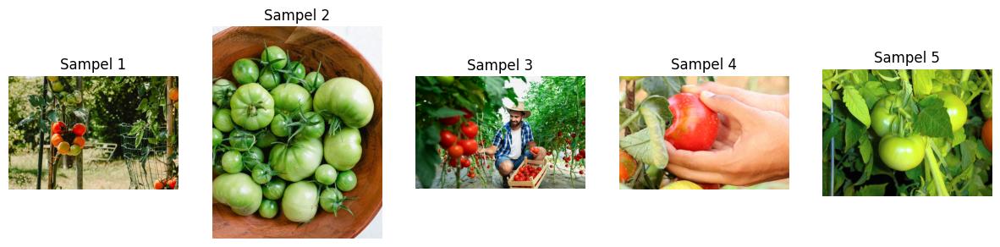

In [ ]:
visualize_samples(images)

Mari kita hitung dan visualisasikan tinggi dan lebar rata-rata gambar dalam dataset.

In [ ]:
def calculate_average_size(images_dir):
    total_width = 0
    total_height = 0
    total_images = 0

    for filename in os.listdir(images_dir):
        if filename.endswith('.jpeg'):  # assuming images are in .jpeg format
            image_path = os.path.join(images_dir, filename)
            image = Image.open(image_path)
            width, height = image.size
            total_width += width
            total_height += height
            total_images += 1

    if total_images > 0:
        average_width = total_width / total_images
        average_height = total_height / total_images
        return average_width, average_height
    else:
        return None

In [ ]:
def plot_average_size(average_width, average_height):
    categories = ['Average Width', 'Average Height']
    values = [average_width, average_height]

    plt.figure(figsize=(6, 4))
    plt.bar(categories, values, color=['skyblue', 'lightgreen'])
    plt.xlabel('Categories')
    plt.ylabel('Pixels')
    plt.title('Average Image Dimensions')
    plt.ylim(0, max(values) * 1.1)
    plt.grid(axis='y')
    plt.show()

Average Image Width: 1374.88 pixels
Average Image Height: 991.36 pixels


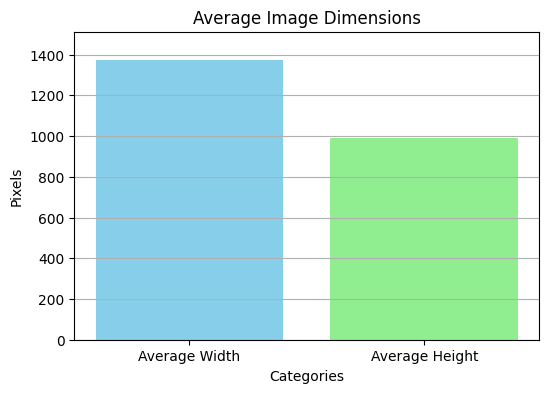

In [ ]:
average_width, average_height = calculate_average_size(images_dir)

if average_width and average_height:
    print(f"Average Image Width: {average_width:.2f} pixels")
    print(f"Average Image Height: {average_height:.2f} pixels")

    # Plot average size
    plot_average_size(average_width, average_height)
else:
    print("No images found or unable to calculate average size.")

Kita juga akan memplot distribusi kelas ('matang' dan 'mentah'), jadi mari kita buat fungsi terpisah untuk ini.

In [ ]:
import matplotlib.pyplot as plt

def plot_class_distribution(annotations):
    classes = {'matang': 0, 'mentah': 0}

    for annotation_file in annotations:
        with open(annotation_file, 'r') as f:
            lines = f.readlines()
            for line in lines:
                class_label = line.split()[0]  # YOLO format
                if class_label == '0':      # unripe
                    classes['mentah'] += 1
                elif class_label == '1':    # ripe
                    classes['matang'] += 1

    # Print counts
    for cls, count in classes.items():
        print(f"{cls}: {count}")

    # Plot
    plt.bar(classes.keys(), classes.values())
    plt.title('Distribusi Kelas Kematangan Tomat')
    plt.xlabel('Kelas')
    plt.ylabel('Jumlah')
    plt.show()


matang: 429
mentah: 440


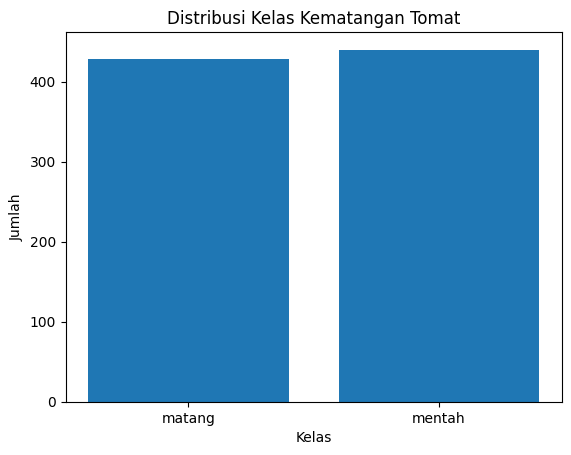

In [ ]:
plot_class_distribution(annotations)

Mari kita telusuri distribusi RGB dari dataset kita. Secara umum, tomat yang matang akan memiliki intensitas yang lebih tinggi pada saluran merah, sedangkan tomat yang belum matang mungkin memiliki intensitas yang lebih tinggi pada saluran hijau.


In [ ]:
from glob import glob

In [ ]:
def read_annotations(annotation_path):
    with open(annotation_path, 'r') as file:
        return file.read().strip()

In [ ]:
def read_image(img_path):
    img = cv2.imread(img_path)
    if img is not None:
        return img
    return np.array([])

In [ ]:
def process_images_in_batches(images, max_images=50, batch_size=10):
    """Process images in batches to reduce memory usage."""
    r_values, g_values, b_values = [], [], []

    # Limit the number of images to max_images
    images = images[:max_images]

    for i in range(0, len(images), batch_size):
        batch = images[i:i + batch_size]
        with ThreadPoolExecutor() as executor:
            img_list = list(executor.map(read_image, batch))

        for img in img_list:
            if img.size > 0:
                r_values.extend(img[:, :, 0].flatten())
                g_values.extend(img[:, :, 1].flatten())
                b_values.extend(img[:, :, 2].flatten())

    return r_values, g_values, b_values

def plot_rgb_distribution(images, category_name, max_images=50, batch_size=10):
    """Plot RGB distribution for the given images."""
    r_values, g_values, b_values = process_images_in_batches(images, max_images, batch_size)

    plt.figure(figsize=(15, 5))

    # Red Channel
    plt.subplot(1, 3, 1)
    r_hist, r_bins = np.histogram(r_values, bins=256, range=(0, 256))
    plt.bar(r_bins[:-1], r_hist, width=1, color='red', alpha=0.5)
    max_r_freq = r_hist.max()
    plt.axhline(max_r_freq, color='red', linestyle='--', label=f'Max Frequency: {max_r_freq}')
    plt.title(f'{category_name} - Red Channel')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    plt.legend()

    # Green Channel
    plt.subplot(1, 3, 2)
    g_hist, g_bins = np.histogram(g_values, bins=256, range=(0, 256))
    plt.bar(g_bins[:-1], g_hist, width=1, color='green', alpha=0.5)
    max_g_freq = g_hist.max()
    plt.axhline(max_g_freq, color='green', linestyle='--', label=f'Max Frequency: {max_g_freq}')
    plt.title(f'{category_name} - Green Channel')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    plt.legend()

    # Blue Channel
    plt.subplot(1, 3, 3)
    b_hist, b_bins = np.histogram(b_values, bins=256, range=(0, 256))
    plt.bar(b_bins[:-1], b_hist, width=1, color='blue', alpha=0.5)
    max_b_freq = b_hist.max()
    plt.axhline(max_b_freq, color='blue', linestyle='--', label=f'Max Frequency: {max_b_freq}')
    plt.title(f'{category_name} - Blue Channel')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    plt.legend()

    plt.tight_layout()
    plt.show()

In [ ]:
# Separate ripe and unripe tomatoes based on annotations
ripe_images = []
unripe_images = []

for img_path, annotation_path in zip(images, annotations):
    annotation = read_annotations(annotation_path)
    if annotation.startswith('1'):
        ripe_images.append(img_path)
    elif annotation.startswith('0'):
        unripe_images.append(img_path)

In [ ]:
print(f"Jumlah citra tomat matang: {len(ripe_images)}")
print(f"Jumlah citra tomat mentah: {len(unripe_images)}")


Jumlah citra tomat matang: 91
Jumlah citra tomat mentah: 86


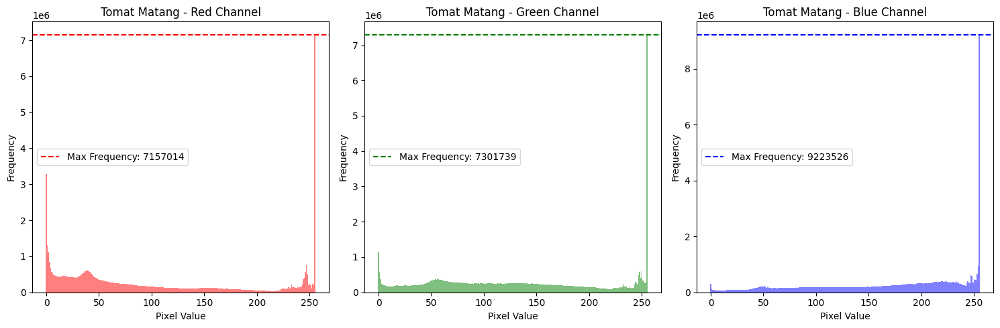

In [ ]:
# Plot RGB distribution for ripe tomatoes
plot_rgb_distribution(ripe_images, 'Tomat Matang')

In [ ]:
# Plot RGB distribution for unripe tomatoes
plot_rgb_distribution(unripe_images, 'Tomat Mentah')

Dari gambar di atas, kita dapat melihat bahwa distribusi warna **MERAH** lebih tinggi untuk tomat matang sedangkan **HIJAU** untuk tomat mentah, menunjukkan bahwa tomat matang memiliki kehadiran warna merah yang lebih kuat dalam gambarnya dan warna hijau untuk tomat mentah. Mari kita terapkan berbagai teknik deteksi tepi dan lihat mana yang lebih baik menangkap fitur tomat.

* **Adaptive Thresholding**: Meningkatkan kontras untuk menyoroti tepi.
* **Laplacian Detection**: Mendeteksi perubahan intensitas yang cepat.
* **Canny Detection**: Mengidentifikasi tepi yang detail melalui analisis gradien.
* **Sobel Detection**: Menemukan tepi menggunakan gradien dalam arah x dan y.

In [ ]:
def calculate_edge_density(edges):
    return np.sum(edges) / edges.size

In [ ]:
def display_random_images_with_edges(basefolder, num_images=5):
    # Tentukan folder gambar dan ambil daftar file gambar
    image_folder = basefolder
    image_files = glob(os.path.join(image_folder, "*.jpeg"))

    # Cek apakah jumlah gambar mencukupi
    if len(image_files) < num_images:
        print(f"Jumlah gambar pada folder {image_folder} tidak mencukupi untuk menampilkan {num_images} gambar.")
        return

    # Pilih gambar secara acak
    selected_images = random.sample(image_files, num_images)

    # Buat subplot untuk menampilkan gambar
    fig, axes = plt.subplots(num_images, 5, figsize=(20, 4 * num_images))

    for idx, image_file in enumerate(selected_images):
        # Baca dan pra-pemrosesan gambar
        img_path = os.path.join(image_folder, image_file)
        img = cv2.imread(img_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Penerapan berbagai teknik deteksi tepi

        # Adaptive Thresholding
        adaptive_thresh = cv2.adaptiveThreshold(
            gray_img, 255,
            cv2.ADAPTIVE_THRESH_MEAN_C,
            cv2.THRESH_BINARY, 11, 3
        )

        # Deteksi tepi Laplacian
        lap = cv2.Laplacian(gray_img, cv2.CV_64F)
        lap = np.uint8(np.absolute(lap))
        lap_rgb = cv2.cvtColor(lap, cv2.COLOR_GRAY2RGB)

        # Deteksi tepi Canny
        mean_intensity = np.mean(gray_img)
        std_intensity = np.std(gray_img)
        lower_threshold = int(max(0, mean_intensity - 2 * std_intensity))
        upper_threshold = int(min(255, mean_intensity + 2 * std_intensity))
        edges = cv2.Canny(gray_img, lower_threshold, upper_threshold)

        # Deteksi tepi Sobel
        sobelx = cv2.Sobel(gray_img, cv2.CV_64F, 1, 0)
        sobely = cv2.Sobel(gray_img, cv2.CV_64F, 0, 1)
        combined_sobel = cv2.bitwise_or(
            cv2.convertScaleAbs(sobelx),
            cv2.convertScaleAbs(sobely)
        )
        combined_sobel_rgb = cv2.cvtColor(combined_sobel, cv2.COLOR_GRAY2RGB)

        # Tampilkan Gambar Asli
        axes[idx, 0].imshow(img_rgb)
        axes[idx, 0].set_title('Gambar Asli')
        axes[idx, 0].axis('off')

        # Tampilkan Adaptive Thresholding
        axes[idx, 1].imshow(adaptive_thresh, cmap='gray')
        axes[idx, 1].set_title('Adaptive Threshold')
        axes[idx, 1].axis('off')

        # Tampilkan Laplacian
        axes[idx, 2].imshow(lap_rgb)
        axes[idx, 2].set_title('Laplacian')
        axes[idx, 2].axis('off')

        # Tampilkan Canny
        axes[idx, 3].imshow(edges, cmap='gray')
        axes[idx, 3].set_title('Canny')
        axes[idx, 3].axis('off')

        # Tampilkan Sobel
        axes[idx, 4].imshow(combined_sobel_rgb)
        axes[idx, 4].set_title('Sobel')
        axes[idx, 4].axis('off')

    # Atur layout dan tampilkan plot
    plt.tight_layout()
    plt.show()


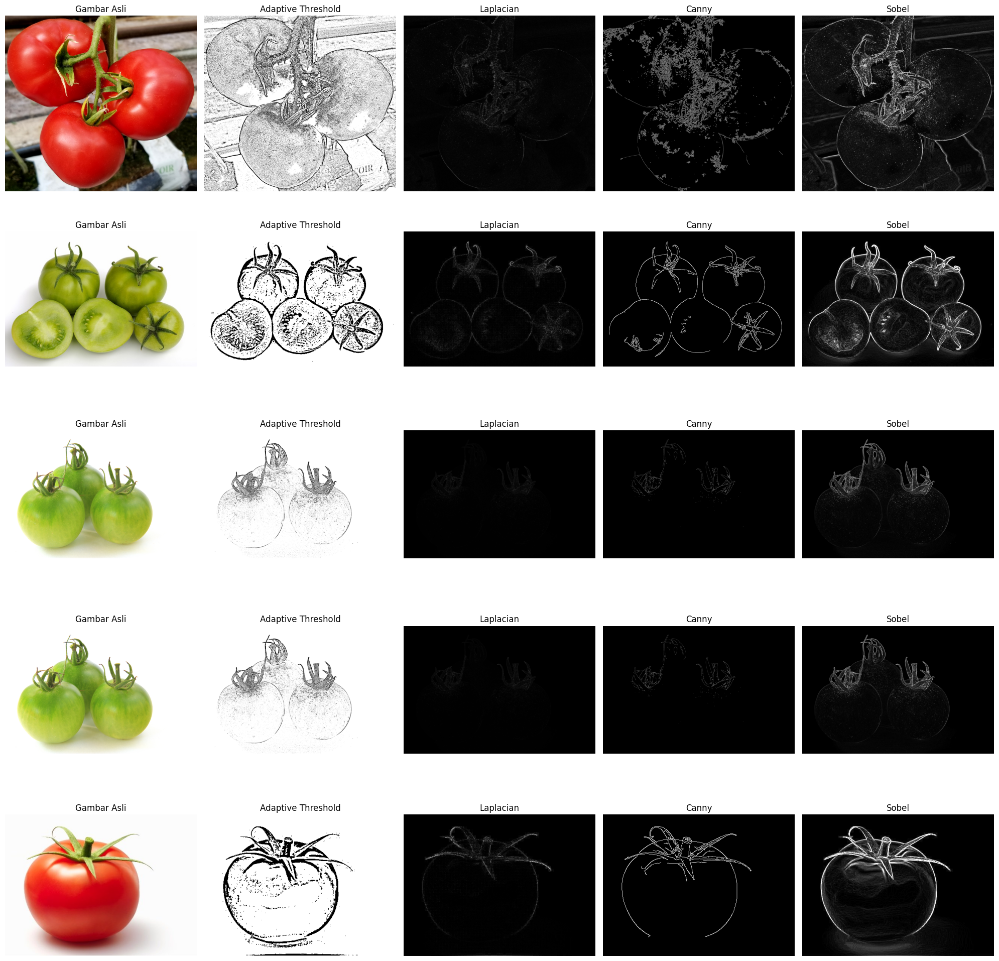

In [ ]:
display_random_images_with_edges(images_dir, num_images=5)

Mari kita bandingkan kepadatan tepi dari deteksi tepi di atas. Untuk itu, kita akan membuat grafik frekuensi terhadap kepadatan tepi dari teknik yang diterapkan di atas.

In [ ]:
def display_edge_density(basefolder, num_images=5):
    image_files = glob(os.path.join(basefolder, "*.jpeg"))

    # Cek apakah jumlah gambar mencukupi
    if len(image_files) < num_images:
        print(f"Jumlah gambar pada folder {basefolder} tidak mencukupi untuk menampilkan {num_images} gambar.")
        return

    # Pilih gambar secara acak
    selected_images = random.sample(image_files, num_images)

    # Menyimpan nilai kerapatan tepi untuk setiap metode
    densities = {
        'Adaptive Threshold': [],
        'Laplacian': [],
        'Canny': [],
        'Sobel': []
    }

    for img_file in selected_images:
        img_path = os.path.join(basefolder, img_file)
        img = cv2.imread(img_path)
        gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Adaptive Thresholding
        adaptive_thresh = cv2.adaptiveThreshold(
            gray_img, 255,
            cv2.ADAPTIVE_THRESH_MEAN_C,
            cv2.THRESH_BINARY, 11, 3
        )
        densities['Adaptive Threshold'].append(
            calculate_edge_density(adaptive_thresh)
        )

        # Deteksi tepi Laplacian
        lap = cv2.Laplacian(gray_img, cv2.CV_64F)
        lap = np.uint8(np.absolute(lap))
        densities['Laplacian'].append(
            calculate_edge_density(lap)
        )

        # Deteksi tepi Canny
        mean_intensity = np.mean(gray_img)
        std_intensity = np.std(gray_img)
        lower_threshold = int(max(0, mean_intensity - 2 * std_intensity))
        upper_threshold = int(min(255, mean_intensity + 2 * std_intensity))
        edges = cv2.Canny(gray_img, lower_threshold, upper_threshold)
        densities['Canny'].append(
            calculate_edge_density(edges)
        )

        # Deteksi tepi Sobel
        sobelx = cv2.Sobel(gray_img, cv2.CV_64F, 1, 0)
        sobely = cv2.Sobel(gray_img, cv2.CV_64F, 0, 1)
        combined_sobel = cv2.bitwise_or(
            cv2.convertScaleAbs(sobelx),
            cv2.convertScaleAbs(sobely)
        )
        densities['Sobel'].append(
            calculate_edge_density(combined_sobel)
        )

    # Plot distribusi kerapatan tepi untuk setiap metode
    plt.figure(figsize=(12, 6))
    for method, density_values in densities.items():
        plt.hist(density_values, bins=10, alpha=0.5, label=method)

    plt.title('Perbandingan Kerapatan Tepi')
    plt.xlabel('Kerapatan Tepi')
    plt.ylabel('Frekuensi')
    plt.legend()
    plt.show()


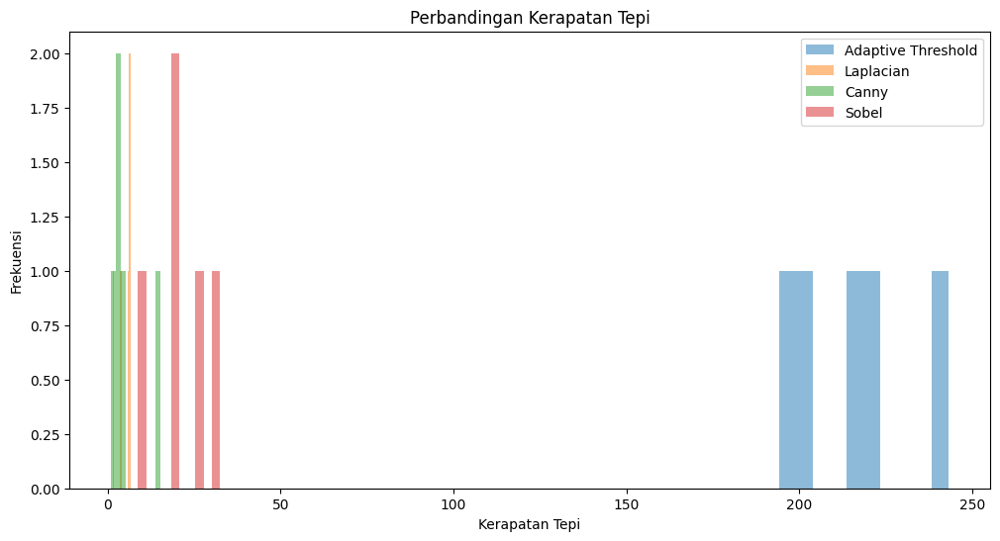

In [ ]:
display_edge_density(images_dir, num_images=5)

Dari uraian di atas, kita dapat melihat frekuensi dan kepadatan tepi dari setiap teknik. Untuk mendeteksi detail yang lebih halus atau tepi yang lebih kuat, frekuensi yang lebih tinggi lebih baik.

Untuk menghitung jumlah gambar yang berisi tomat 'matang' dan 'mentah', mari kita buat fungsi `count_mixed_images` yang menerima daftar anotasi sebagai argumen.

In [ ]:
def count_mixed_images(annotations):
    mixed_images_count = 0

    for annotation_file in annotations:
        with open(annotation_file, 'r') as f:
            lines = f.readlines()
            has_ripe = False
            has_unripe = False
            for line in lines:
                class_label = int(line.split()[0])
                if class_label == 0:
                    has_unripe = True
                elif class_label == 1:
                    has_ripe = True
            if has_ripe and has_unripe:
                mixed_images_count += 1

    return mixed_images_count

In [ ]:
mixed_images_count = count_mixed_images(annotations)

print(f"Jumlah Gambar Campuran: {mixed_images_count}")


Jumlah Gambar Campuran: 33


Untuk membuat grafik jumlah gambar yang berisi tomat 'matang' dan 'mentah'. Mari kita buat fungsi terpisah.

In [ ]:
def plot_mixed_images_count(mixed_images_count):
    categories = ['Gambar Campuran']
    counts = [mixed_images_count]

    plt.figure(figsize=(6, 4))
    plt.bar(categories, counts, color='skyblue')
    plt.xlabel('Kategori')
    plt.ylabel('Jumlah Gambar')
    plt.title('Gambar yang Mengandung Tomat Matang dan Mentah')
    plt.ylim(0, max(counts) * 1.1)
    plt.grid(axis='y')
    plt.show()


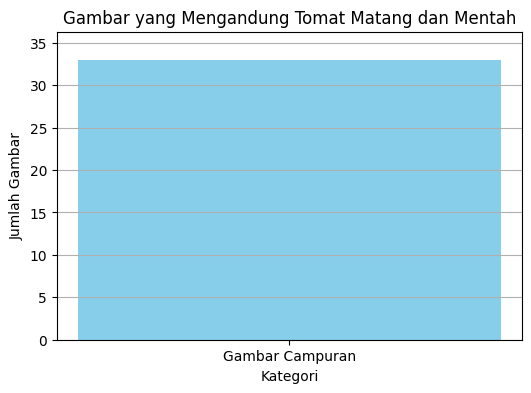

In [ ]:
# Plotting mixed images count
plot_mixed_images_count(mixed_images_count)

Dataset ini berisi gambar tomat yang matang dan mentah, jadi mari kita buat fungsi untuk menemukan dan menampilkan contoh gambar yang memiliki keduanya.

In [ ]:
def show_sample_mixed_images(images_dir, labels_dir, num_samples=3):
    # Load dataset
    images, annotations = load_data(images_dir, labels_dir)

    # Initialize a list to store paths of mixed images
    mixed_image_paths = []

    # Iterate through annotations to find images with both classes
    for i, annotation_file in enumerate(annotations):
        with open(annotation_file, 'r') as f:
            lines = f.readlines()
            has_ripe = False
            has_unripe = False
            for line in lines:
                class_label = int(line.split()[0])  # assuming YOLO format with class label as first entry
                if class_label == 0:
                    has_unripe = True
                elif class_label == 1:
                    has_ripe = True
            if has_ripe and has_unripe:
                mixed_image_paths.append(images[i])

        # Stop when enough samples are found
        if len(mixed_image_paths) >= num_samples:
            break

    # Display sample images
    if mixed_image_paths:
        plt.figure(figsize=(15, 6))
        for i, image_path in enumerate(random.sample(mixed_image_paths, num_samples)):
            image = Image.open(image_path)
            plt.subplot(1, num_samples, i + 1)
            plt.imshow(image)
            plt.axis('off')
            plt.title(f'Sampel {i+1}')
        plt.tight_layout()
        plt.show()
    else:
        print("Tidak ditemukan gambar yang menampilkan tomat matang dan mentah sekaligus.")

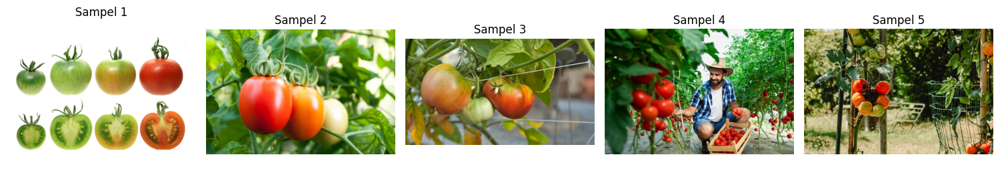

In [ ]:
show_sample_mixed_images(images_dir, labels_dir, num_samples=5)

Untuk menggambar kotak pembatas pada gambar berdasarkan anotasi, kita akan menggunakan fungsi draw_bounding_boxes.

In [ ]:
def draw_bounding_boxes(image_path, annotation_path):
    image = Image.open(image_path)
    draw = ImageDraw.Draw(image)
    with open(annotation_path, 'r') as f:
        for line in f:
            class_label, x_center, y_center, width, height = map(float, line.strip().split())
            # Convert YOLO format to bounding box coordinates
            img_width, img_height = image.size
            x_center *= img_width
            y_center *= img_height
            width *= img_width
            height *= img_height
            x_min = x_center - (width / 2)
            x_max = x_center + (width / 2)
            y_min = y_center - (height / 2)
            y_max = y_center + (height / 2)
            # Draw rectangle
            if class_label == 0:
                color = 'green'  # unripe
            else:
                color = 'red'  # ripe
            draw.rectangle([x_min, y_min, x_max, y_max], outline=color, width=2)
    return image

Karena dimungkinkan untuk menampilkan tomat matang dan mentah dalam satu gambar, mari kita buat fungsi untuk menampilkan gambar-gambar ini dengan kotak pembatas.

In [ ]:
def show_sample_mixed_images_with_bounding_boxes(images_dir, labels_dir, num_samples=3):
    # Load dataset
    images, annotations = load_data(images_dir, labels_dir)

    # Initialize a list to store paths of mixed images
    mixed_image_paths = []

    # Iterate through annotations to find images with both classes
    for i, annotation_file in enumerate(annotations):
        with open(annotation_file, 'r') as f:
            lines = f.readlines()
            has_ripe = False
            has_unripe = False
            for line in lines:
                class_label = int(line.split()[0])  # assuming YOLO format with class label as first entry
                if class_label == 0:
                    has_unripe = True
                elif class_label == 1:
                    has_ripe = True
            if has_ripe and has_unripe:
                mixed_image_paths.append((images[i], annotations[i]))

        # Stop when enough samples are found
        if len(mixed_image_paths) >= num_samples:
            break

    # Display sample images
    if mixed_image_paths:
        plt.figure(figsize=(15, 6))
        for i, (image_path, annotation_path) in enumerate(random.sample(mixed_image_paths, num_samples)):
            original_image = Image.open(image_path)
            annotated_image = draw_bounding_boxes(image_path, annotation_path)

            plt.subplot(2, num_samples, i + 1)
            plt.imshow(original_image)
            plt.axis('off')
            plt.title(f'Gambar asli {i+1}')

            plt.subplot(2, num_samples, num_samples + i + 1)
            plt.imshow(annotated_image)
            plt.axis('off')
            plt.title(f'Anotasi {i+1}')

        plt.tight_layout()
        plt.show()
    else:
        print("Tidak ditemukan gambar yang menampilkan tomat matang dan mentah sekaligus.")

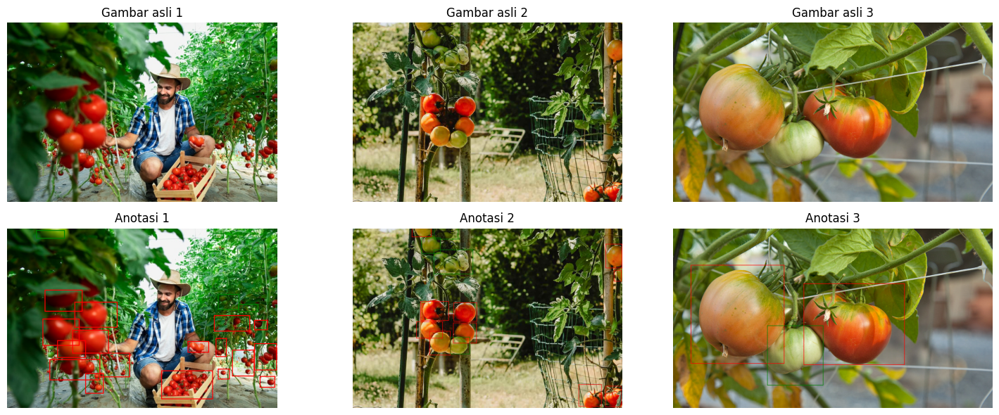

In [ ]:
show_sample_mixed_images_with_bounding_boxes(images_dir, labels_dir, num_samples=3)

In [ ]:
# Handle potential train/test subdirectories
working_dir = os.path.join("/kaggle","working")
train_images_dir = os.path.join(working_dir, "train", "images")
train_labels_dir = os.path.join(working_dir, "train", 'labels')
test_images_dir = os.path.join(working_dir,"test", 'images')
test_labels_dir = os.path.join(working_dir, "test", 'labels')

print(f"Train Images Dir: {train_images_dir}, Train Labels Dir: {train_labels_dir}")
print(f"Test Images Dir: {test_images_dir}, Test Labels Dir: {test_labels_dir}")

Train Images Dir: /kaggle/working/train/images, Train Labels Dir: /kaggle/working/train/labels
Test Images Dir: /kaggle/working/test/images, Test Labels Dir: /kaggle/working/test/labels


In [ ]:
# Create train/test directories if they don't exist (using os.makedirs with exist_ok=True)
os.makedirs(train_images_dir, exist_ok=True)
os.makedirs(train_labels_dir, exist_ok=True)
os.makedirs(test_images_dir, exist_ok=True)
os.makedirs(test_labels_dir, exist_ok=True)

Setelah kita membuat folder-folder yang sesuai, mari kita mulai mengimpor gambar-gambar tersebut.

In [ ]:
# Get list of images and labels
images = [f for f in os.listdir(images_dir) if f.endswith('.jpeg')]
labels = [f.replace('.jpeg', '.txt') for f in images]

Mari kita lihat sekilas jumlah gambar dan label yang kita miliki.

In [ ]:
print(f"Panjang Gambar: {len(images)}")
print(f"Panjang Label: {len(labels)}")

Panjang Gambar: 177
Panjang Label: 177


Kita memiliki jumlah gambar dan label yang sama. Sekarang, kita akan membagi dataset, di mana set pelatihan akan berisi `80%` gambar dan sisanya `20%` akan berada di set pengujian.

In [ ]:
# Split into training and testing sets
train_images, test_images = train_test_split(images, test_size=0.2, random_state=42)
train_labels = [f.replace('.jpeg', '.txt') for f in train_images]
test_labels = [f.replace('.jpeg', '.txt') for f in test_images]
print(f"Training set: {len(train_images)} Gambar, {len(train_labels)} label")
print(f"Testing set: {len(test_images)} Gambar, {len(test_labels)} label")

Training set: 141 Gambar, 141 label
Testing set: 36 Gambar, 36 label


Setelah membagi dataset, mari kita pindahkan file-file tersebut ke folder masing-masing.

In [ ]:
# Copy files to the respective directories
def copy_files(file_list, src_path, dst_path):
    for file in file_list:
        shutil.copy(os.path.join(src_path, file), os.path.join(dst_path, file))

In [ ]:
copy_files(train_images, images_dir, train_images_dir)
copy_files(train_labels, labels_dir, train_labels_dir)
copy_files(test_images, images_dir, test_images_dir)
copy_files(test_labels, labels_dir, test_labels_dir)


In [ ]:
def calculate_iou(box1, box2):
    x1, y1, w1, h1 = box1
    x2, y2, w2, h2 = box2

    xi1 = max(x1, x2)
    yi1 = max(y1, y2)
    xi2 = min(x1 + w1, x2 + w2)
    yi2 = min(y1 + h1, y2 + h2)

    inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
    box1_area = w1 * h1
    box2_area = w2 * h2

    union_area = box1_area + box2_area - inter_area

    return inter_area / union_area

In [ ]:

def calculate_iou(box1, box2):
    xi1 = max(box1[0], box2[0])
    yi1 = max(box1[1], box2[1])
    xi2 = min(box1[2], box2[2])
    yi2 = min(box1[3], box2[3])

    inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])

    union_area = box1_area + box2_area - inter_area
    return inter_area / union_area if union_area != 0 else 0

def convert_yolo_to_bbox(yolo_bbox, img_width, img_height):
    x_center, y_center, width, height = yolo_bbox
    x_min = (x_center - width / 2) * img_width
    x_max = (x_center + width / 2) * img_width
    y_min = (y_center - height / 2) * img_height
    y_max = (y_center + height / 2) * img_height
    return [x_min, y_min, x_max, y_max]


ious = []

for annotation_file in annotations:
    with open(annotation_file, 'r') as file:
        lines = file.readlines()
        boxes = []
        for line in lines:
            _, x_center, y_center, width, height = map(float, line.split())
            bbox = convert_yolo_to_bbox([x_center, y_center, width, height], img_width=average_width, img_height=average_height)
            boxes.append(bbox)
        # Calculate IoU for every pair of boxes in the same image
        for i in range(len(boxes)):
            for j in range(i + 1, len(boxes)):
                iou = calculate_iou(boxes[i], boxes[j])
                ious.append(iou)

average_iou = np.mean(ious)
print("Average IoU:", average_iou)

Average IoU: 0.021127348493532178


## 2. Pembuatan Model
Untuk proyek kita tentang mendeteksi tomat matang dan mentah, mari kita instal YOLO dan verifikasi fungsinya.

In [ ]:
# setup
%pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics 8.3.240 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 38.6/112.6 GB disk)


Selanjutnya, mari kita buat file konfigurasi untuk YOLO. File ini menyediakan informasi tentang dataset dan kelas-kelas yang terdapat di dalamnya.

In [ ]:
dataset_yaml = """
train: /kaggle/working/train/images
val: /kaggle/working/test/images

nc: 2  # number of classes
names: ['unripe', 'ripe']  # class names
"""

with open('/kaggle/working/dataset.yaml', 'w') as file:
    file.write(dataset_yaml)

Mari kita periksa perintah-perintah yang tersedia di YOLOv8.

In [ ]:
!yolo


    Arguments received: ['yolo']. Ultralytics 'yolo' commands use the following syntax:

        yolo TASK MODE ARGS

        Where   TASK (optional) is one of ['detect', 'obb', 'classify', 'pose', 'segment']
                MODE (required) is one of ['train', 'track', 'val', 'benchmark', 'export', 'predict']
                ARGS (optional) are any number of custom 'arg=value' pairs like 'imgsz=320' that override defaults.
                    See all ARGS at https://docs.ultralytics.com/usage/cfg or with 'yolo cfg'

    1. Train a detection model for 10 epochs with an initial learning_rate of 0.01
        yolo train data=coco8.yaml model=yolo11n.pt epochs=10 lr0=0.01

    2. Predict a YouTube video using a pretrained segmentation model at image size 320:
        yolo predict model=yolo11n-seg.pt source='https://youtu.be/LNwODJXcvt4' imgsz=320

    3. Validate a pretrained detection model at batch-size 1 and image size 640:
        yolo val model=yolo11n.pt data=coco8.yaml batch=1 imgs

## 3. Pelatihan Model
Kita akan melatih model kita menggunakan `130` epoch dengan ukuran batch `16`, dan kita akan mengatur ukuran gambar menjadi `640`.


In [ ]:
# from ultralytics import YOLO
# from IPython.display import Image, display

# # Load the trained YOLO model
# model = YOLO('yolov8n.pt')
# data_yaml_path = "/kaggle/working/dataset.yaml"

# results = model.train(data = data_yaml_path,
#             epochs=150,
#             imgsz=720,
#             device=[0,1],
#             multi_scale=True,

#             batch=32,
#             lr0=0.01,  # initial learning rate
#             lrf=0.005,  # final learning rate
#             save_period=5,
#             workers=8
#            )


In [ ]:
dataset_yaml_path = "/kaggle/working/dataset.yaml"

yaml_content = """
train: /kaggle/working/train/images
val: /kaggle/working/test/images

nc: 2
names:
  0: mentah
  1: matang
"""

with open(dataset_yaml_path, "w") as f:
    f.write(yaml_content)

print("dataset.yaml berhasil diperbarui!")


dataset.yaml berhasil diperbarui!


In [ ]:
from ultralytics import YOLO
from IPython.display import Image, display

model = YOLO('yolov8m.pt')
data_yaml_path = "/kaggle/working/dataset.yaml"

results = model.train(
    data=data_yaml_path,
    epochs=150,
    imgsz=640,
    device=[0],

    #  REDUCE aggressive augmentations causing instability
    augment=True,
    hsv_h=0.05,    #  Reduce from 0.1 (less color variation)
    hsv_s=0.5,     #  Reduce from 0.7
    hsv_v=0.3,     #  Reduce from 0.4
    degrees=10.0,  #  Reduce from 15.0
    shear=1.0,     #  Reduce from 2.0
    mosaic=0.5,    #  Reduce from 1.0 (use mosaic 50% of time)
    mixup=0.05,    #  Reduce from 0.1 (very little mixup)

    # STABILIZE learning rate
    lr0=0.0005,    #  Lower initial LR (MOST IMPORTANT)
    lrf=0.1,       # Gradual decrease to 0.00005
    warmup_epochs=3.0,  #  ADD warmup
    warmup_momentum=0.8,

    #  Optimizer adjustments
    batch=16,
    momentum=0.9,   #  Slightly lower momentum
    weight_decay=0.0005,

    #  Disable unstable features
    multi_scale=False,
    amp=True,
    workers=4,
    patience=50,
    save_period=10
)

Ultralytics 8.3.240 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/dataset.yaml, degrees=10.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=150, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.05, hsv_s=0.5, hsv_v=0.3, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0005, lrf=0.1, mask_ratio=4, max_det=300, mixup=0.05, mode=train, model=yolov8m.pt, momentum=0.9, mosaic=0.5, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=50, perspective=0.0, plots=True, pose=12.0,

## 4. Evaluasi Model
Mari kita plot hasil pengujian dan kemudian lakukan evaluasi pada set validasi.

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# 1. Pastikan path benar
base_path = '/kaggle/working/runs/detect/train'
tpaths2 = []

# 2. Cek apakah folder ada sebelum melakukan walk
if os.path.exists(base_path):
    for dirname, _, filenames in os.walk(base_path):
        for filename in filenames:
            # Menggunakan .lower() agar file .JPG atau .PNG juga terbaca
            if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
                tpaths2.append(os.path.join(dirname, filename))

    tpaths2 = sorted(tpaths2)

    # 3. Cek apakah ada file yang ditemukan agar tidak IndexError
    if len(tpaths2) > 0:
        print(f"File pertama: {tpaths2[0]}")

        for path in tpaths2:
            image = Image.open(path)
            image_np = np.array(image)

            plt.figure(figsize=(20, 10))
            plt.imshow(image_np)
            plt.title(os.path.basename(path)) # Menambahkan judul agar tahu file apa
            plt.axis('off') # Menghilangkan sumbu koordinat agar rapi
            plt.show()
    else:
        print("Peringatan: Tidak ditemukan file gambar di folder tersebut.")
else:
    print(f"Error: Folder {base_path} tidak ditemukan.")

Error: Folder /kaggle/working/runs/detect/train tidak ditemukan.


In [ ]:
import os

# Melihat semua isi folder di /kaggle/working secara mendalam
for root, dirs, files in os.walk('/kaggle/working'):
    level = root.replace('/kaggle/working', '').count(os.sep)
    indent = ' ' * 4 * (level)
    print(f"{indent}{os.path.basename(root)}/")

working/
    train/
        labels/
        images/
    test/
        labels/
        images/


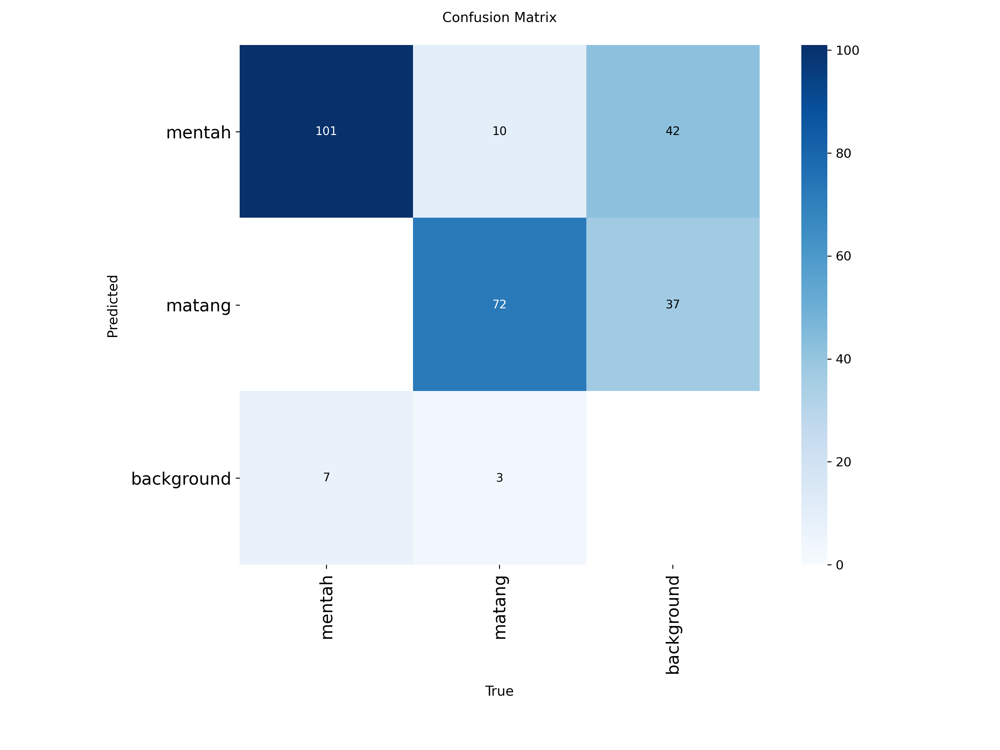

In [ ]:
conf_matrix_path = '/content/runs/detect/train/confusion_matrix.png'
# Fallback jika path di atas tidak ada
if not os.path.exists(conf_matrix_path):
    conf_matrix_path = '/kaggle/working/runs/detect/train/confusion_matrix.png'

if os.path.exists(conf_matrix_path):
    display(Image(filename=conf_matrix_path, width=600))
else:
    print("Confusion matrix belum tersedia.")

Mengambil data dari: /content/runs/detect/train
------------------------------
### 1. Grafik Progres Training (Loss, Precision, Recall, mAP)


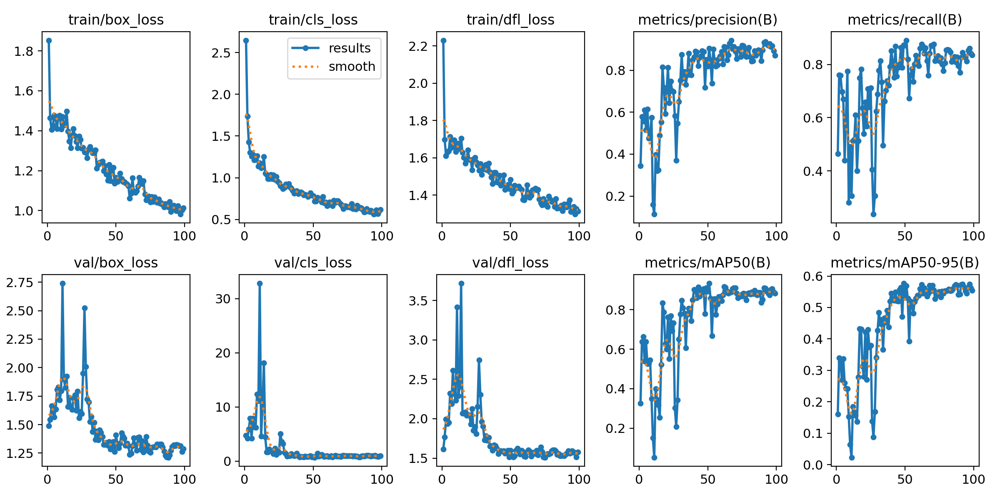


### 2. Statistik Distribusi Label & Bounding Box


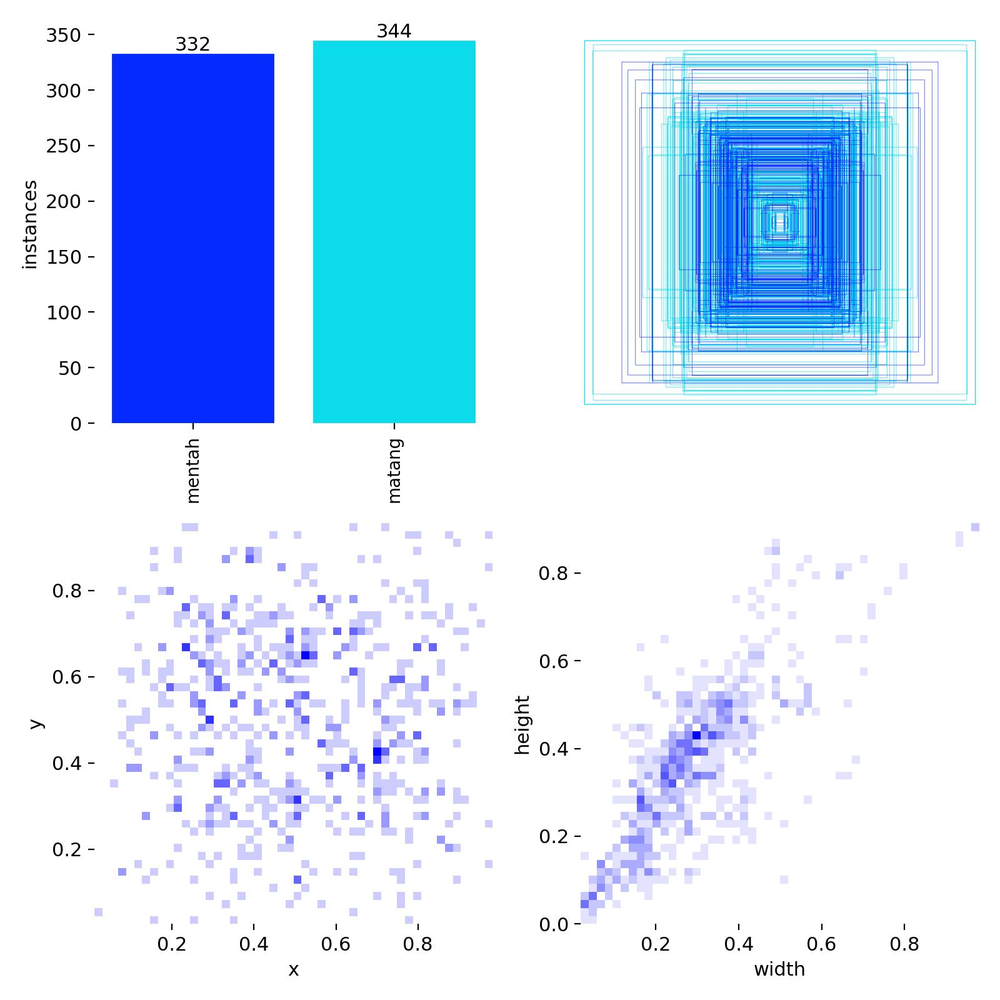


### 3. Confusion Matrix (Normalized)


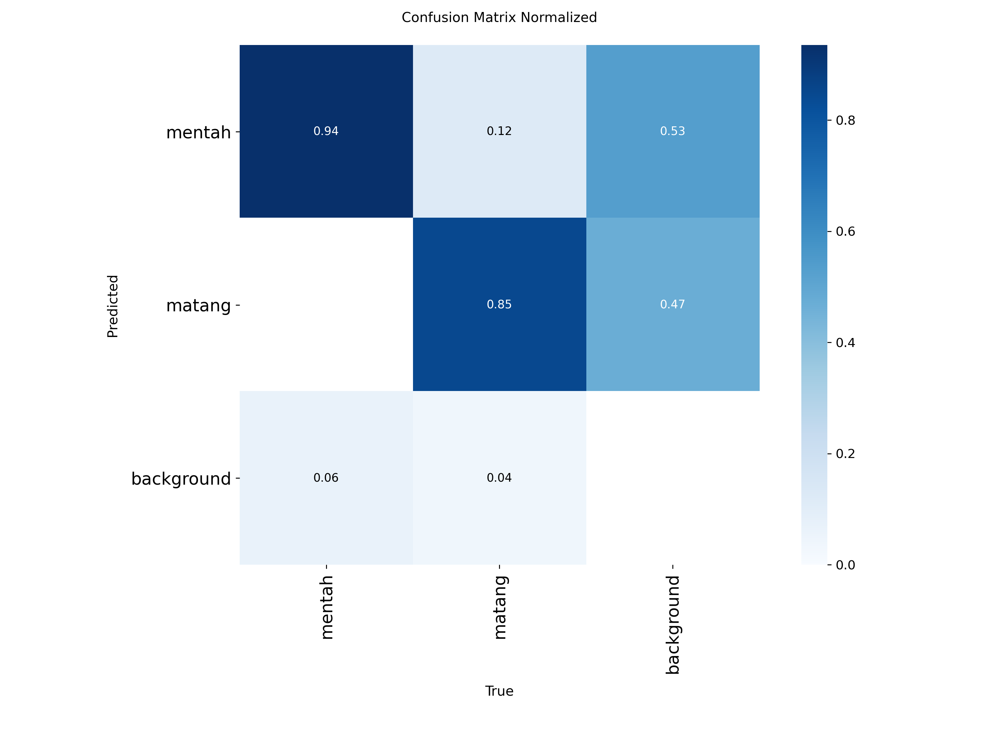


### 4. Sampel Hasil Prediksi Model
Menampilkan: val_batch0_pred.jpg


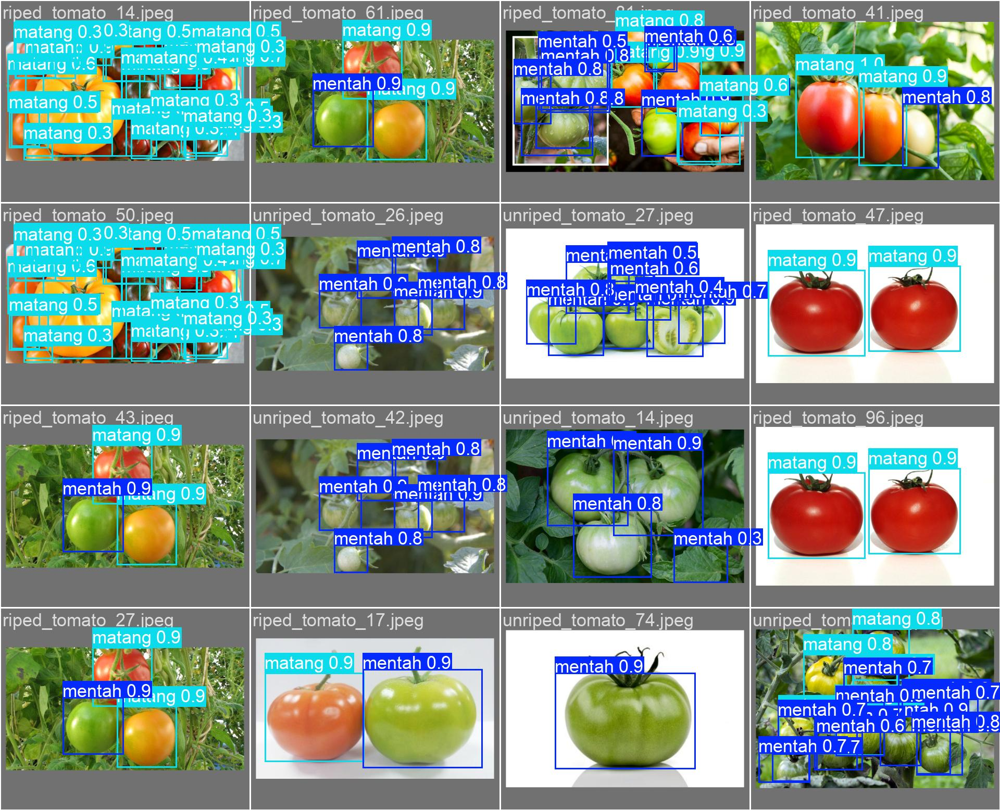

Menampilkan: val_batch1_pred.jpg


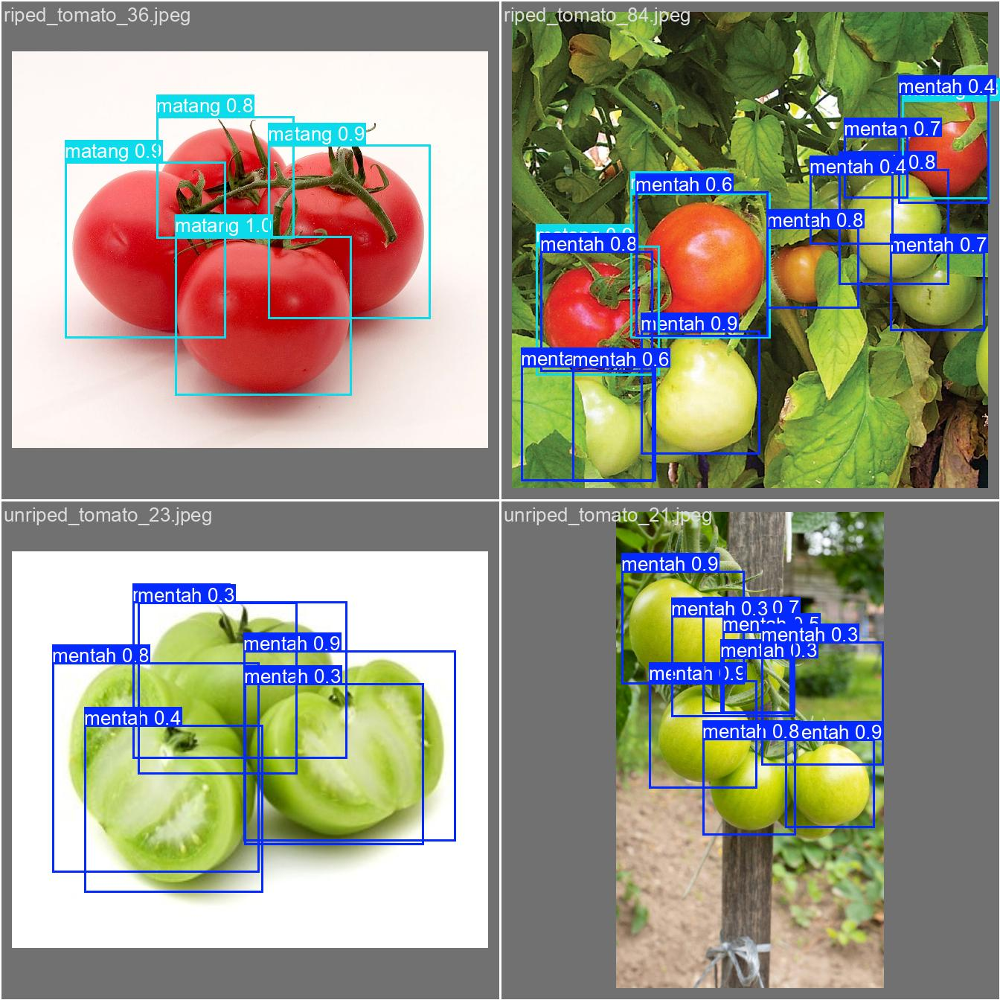

In [ ]:
import os
import glob
from IPython.display import Image, display

# --- 1. SETTING DIRECTORY ---
# Cek apakah running di Google Colab atau Kaggle
save_dir = '/content/runs/detect/train'
if not os.path.exists(save_dir):
    save_dir = '/kaggle/working/runs/detect/train'

print(f"Mengambil data dari: {save_dir}")
print("-" * 30)

# --- 2. GRAFIK HASIL TRAINING (Loss & Metrik) ---
# Menampilkan file x8.JPG (results.png)
results_path = os.path.join(save_dir, 'results.png')
if os.path.exists(results_path):
    print("### 1. Grafik Progres Training (Loss, Precision, Recall, mAP)")
    display(Image(filename=results_path, width=800))
else:
    print("File results.png tidak ditemukan.")

# --- 3. STATISTIK LABEL ---
# Menampilkan file x7.JPG (labels.jpg)
labels_path = os.path.join(save_dir, 'labels.jpg')
if os.path.exists(labels_path):
    print("\n### 2. Statistik Distribusi Label & Bounding Box")
    display(Image(filename=labels_path, width=700))

# --- 4. ANALISIS AKURASI (CONFUSION MATRIX) ---
# Menampilkan file x6.JPG (confusion_matrix_normalized.png)
conf_matrix_path = os.path.join(save_dir, 'confusion_matrix_normalized.png')
if os.path.exists(conf_matrix_path):
    print("\n### 3. Confusion Matrix (Normalized)")
    display(Image(filename=conf_matrix_path, width=600))
else:
    print("Confusion matrix normalized belum tersedia.")

# --- 5. VISUALISASI HASIL PREDIKSI PADA DATA VALIDASI ---
# Mencari file val_batch*_pred.jpg
val_preds = glob.glob(f'{save_dir}/val_batch*_pred.jpg')

if val_preds:
    print("\n### 4. Sampel Hasil Prediksi Model")
    for img_path in sorted(val_preds)[:3]: # Menampilkan hingga 3 batch pertama
        print(f"Menampilkan: {os.path.basename(img_path)}")
        display(Image(filename=img_path, width=800))
else:
    print("\nFile prediksi validasi (val_batch*_pred.jpg) belum tersedia.")

Ditemukan 28 gambar yang mengandung Tomat Mentah
Ditemukan 20 gambar yang mengandung Tomat Matang


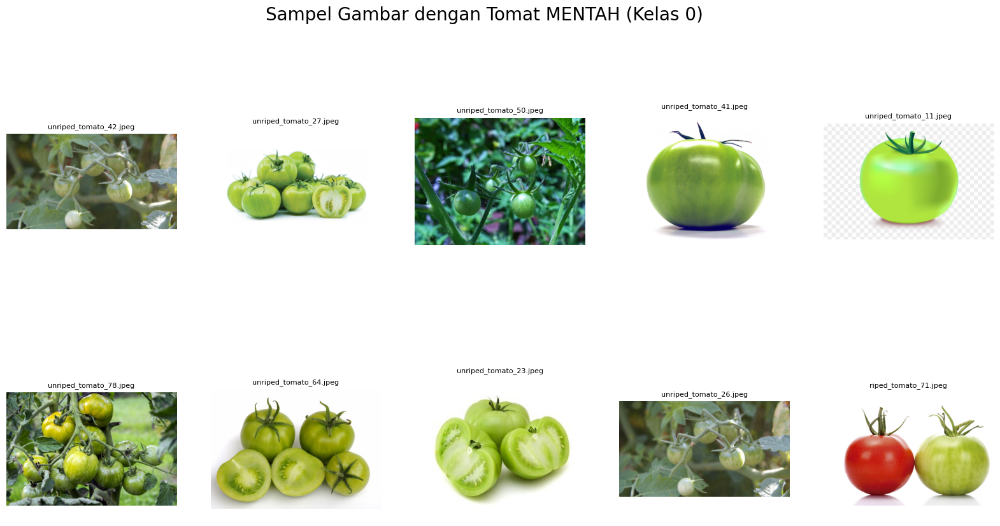

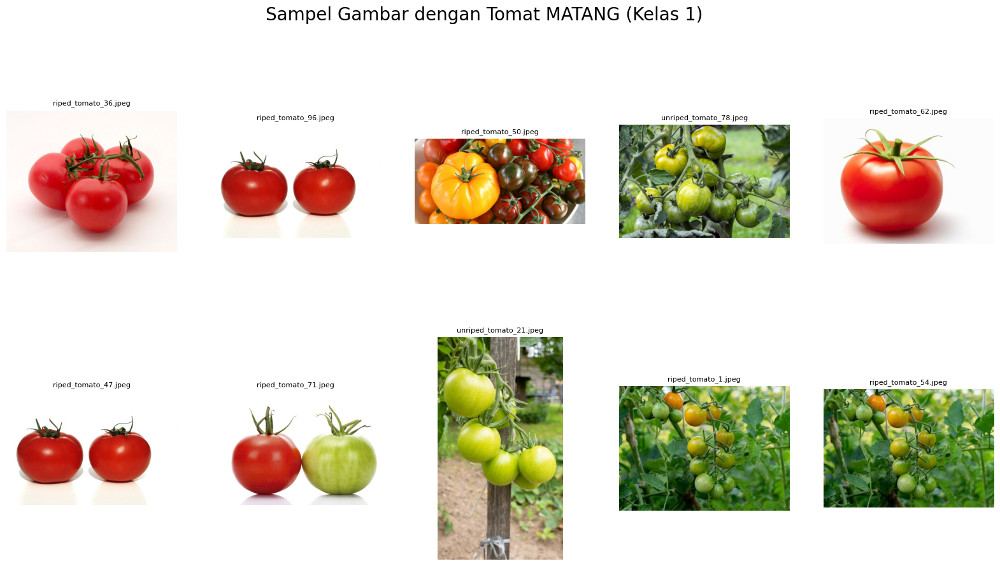

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
from PIL import Image

# Path folder (sesuaikan dengan struktur folder Anda)
image_folder = '/kaggle/working/test/images'
label_folder = '/kaggle/working/test/labels'

def get_images_by_class(target_class):
    """Fungsi untuk mencari file gambar yang mengandung kelas tertentu"""
    found_images = []
    # List semua file label
    label_files = [f for f in os.listdir(label_folder) if f.endswith('.txt')]

    for label_file in label_files:
        with open(os.path.join(label_folder, label_file), 'r') as f:
            lines = f.readlines()
            # Cek apakah kelas target ada di dalam file label ini
            classes_in_file = [line.split()[0] for line in lines]
            if str(target_class) in classes_in_file:
                # Cari gambar yang namanya sama dengan file label
                img_name = label_file.replace('.txt', '.jpeg') # sesuaikan jika .jpg
                if os.path.exists(os.path.join(image_folder, img_name)):
                    found_images.append(img_name)
    return found_images

# 1. Ambil list gambar untuk masing-masing kelas
# Asumsi: 0 = mentah, 1 = matang (sesuaikan dengan data.yaml Anda)
list_mentah = get_images_by_class(0)
list_matang = get_images_by_class(1)

print(f"Ditemukan {len(list_mentah)} gambar yang mengandung Tomat Mentah")
print(f"Ditemukan {len(list_matang)} gambar yang mengandung Tomat Matang")

def display_images(img_list, title, max_display=10):
    """Fungsi untuk menampilkan grid gambar"""
    plt.figure(figsize=(20, 10))
    plt.suptitle(title, fontsize=20)
    for i, img_name in enumerate(img_list[:max_display]): # Tampilkan maksimal 10 agar tidak terlalu berat
        img_path = os.path.join(image_folder, img_name)
        img = Image.open(img_path)
        plt.subplot(2, 5, i + 1)
        plt.imshow(img)
        plt.title(img_name, fontsize=8)
        plt.axis('off')
    plt.show()

# 2. Tampilkan hasilnya
if list_mentah:
    display_images(list_mentah, "Sampel Gambar dengan Tomat MENTAH (Kelas 0)")

if list_matang:
    display_images(list_matang, "Sampel Gambar dengan Tomat MATANG (Kelas 1)")

In [ ]:
# evaluate model performance on the validation set
results = model.val()

Ultralytics 8.3.240 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2187.0±674.8 MB/s, size: 266.4 KB)
val: Scanning /kaggle/working/test/labels.cache... 36 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 36/36 90.9Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.1it/s 2.7s
                   all         36        193      0.901      0.844      0.916       0.59
                mentah         28        108      0.861      0.926      0.921      0.589
                matang         20         85      0.942      0.762      0.911       0.59
Speed: 5.5ms preprocess, 18.6ms inference, 0.2ms loss, 2.4ms postprocess per image
Results saved to /content/runs/detect/val2


In [ ]:
# Menjalankan validasi dengan ukuran gambar 640 dan batch size 16
results = model.val(imgsz=640, batch=16, conf=0.25)

Ultralytics 8.3.240 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1882.6±558.2 MB/s, size: 2826.1 KB)
val: Scanning /kaggle/working/test/labels.cache... 36 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 36/36 78.0Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.1it/s 2.7s
                   all         36        193      0.896      0.839      0.912      0.625
                mentah         28        108      0.861      0.926      0.932      0.631
                matang         20         85      0.931      0.753      0.892       0.62
Speed: 8.8ms preprocess, 18.4ms inference, 0.0ms loss, 7.9ms postprocess per image
Results saved to /content/runs/detect/val3


## 5. Pengujian

Mari kita uji model kita dengan gambar uji.


image 1/1 /kaggle/working/test/images/unriped_tomato_21.jpeg: 640x384 5 mentahs, 74.2ms
Speed: 3.1ms preprocess, 74.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 384)


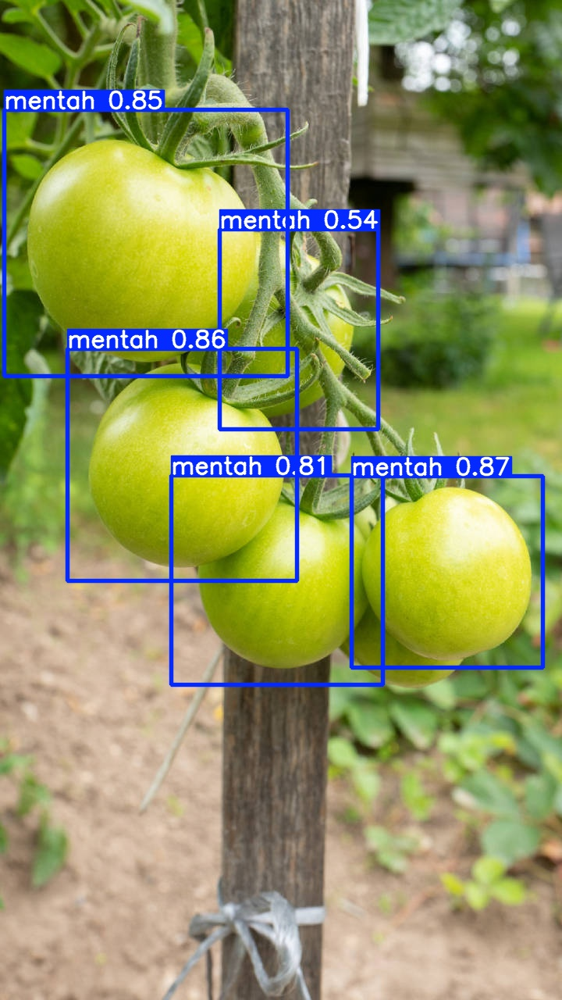


image 1/1 /kaggle/working/test/images/unriped_tomato_64.jpeg: 480x640 5 mentahs, 83.8ms
Speed: 4.8ms preprocess, 83.8ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


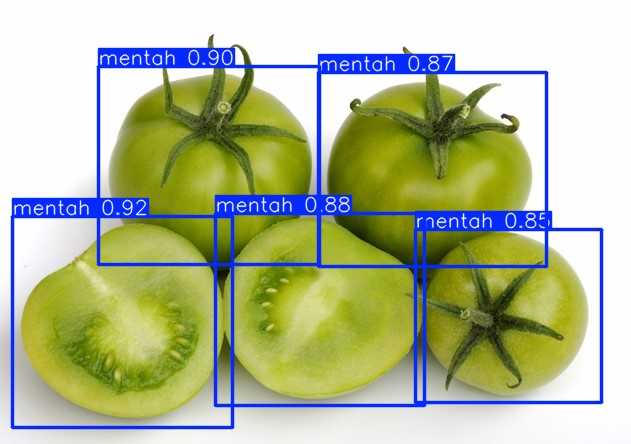


image 1/1 /kaggle/working/test/images/unriped_tomato_14.jpeg: 416x640 3 mentahs, 66.6ms
Speed: 3.1ms preprocess, 66.6ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


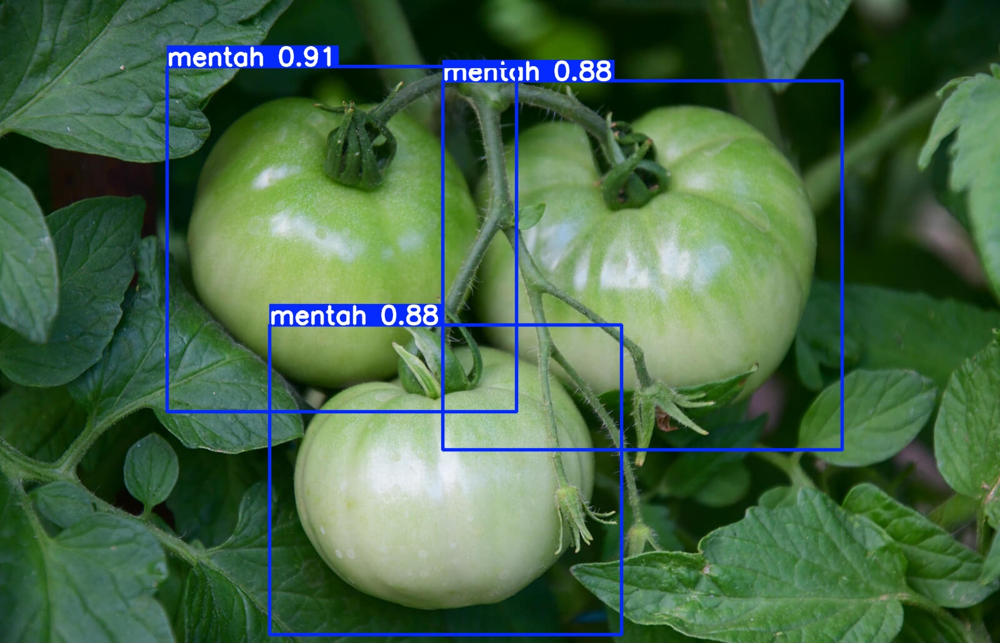


image 1/1 /kaggle/working/test/images/unriped_tomato_19.jpeg: 448x640 2 mentahs, 27.6ms
Speed: 3.9ms preprocess, 27.6ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)


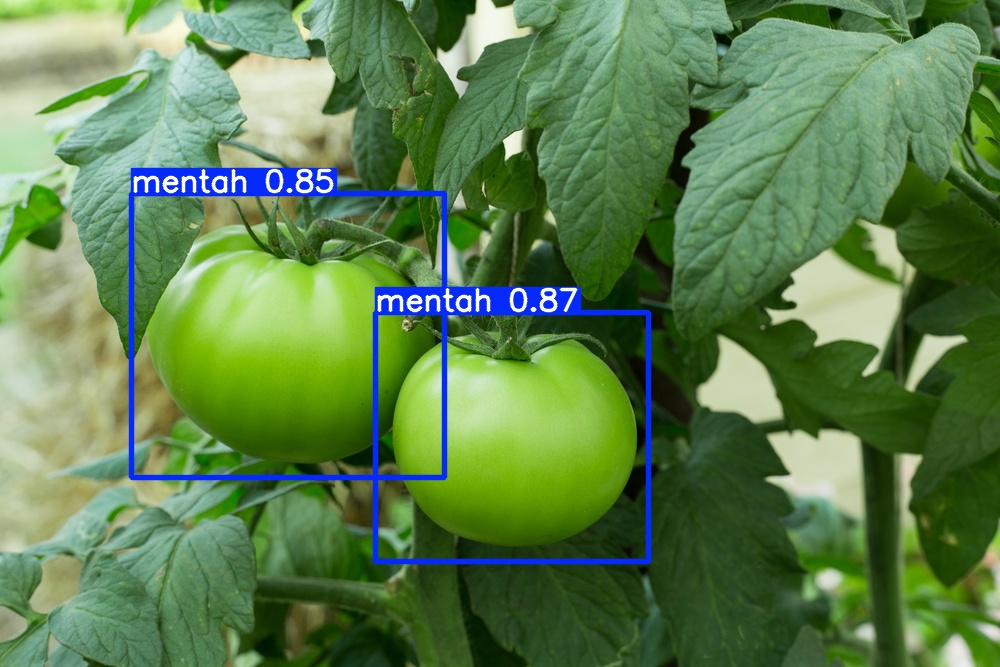


image 1/1 /kaggle/working/test/images/riped_tomato_50.jpeg: 320x640 13 matangs, 77.6ms
Speed: 2.3ms preprocess, 77.6ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 640)


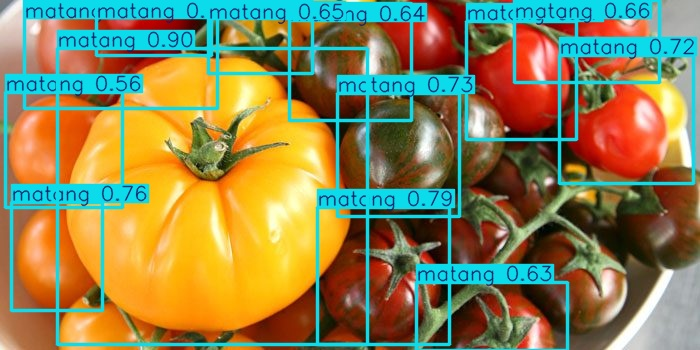

In [ ]:
import os
import random
import cv2
from PIL import Image as PILImage  # Menggunakan alias agar tidak bentrok
from IPython.display import display, Image as IPImage

# Define the path to the images
images_path = '/kaggle/working/test/images'
num_images = 5

# Sample a subset of images
# Pastikan ekstensi sesuai (.jpeg atau .jpg)
all_images = [f for f in os.listdir(images_path) if f.lower().endswith(('.jpeg', '.jpg'))]
images = random.sample(all_images, min(len(all_images), num_images))

# Show the results on test images
for image in images:
    img_path = os.path.join(images_path, image)
    results = model(img_path, conf=0.5, iou=0.6)
    r = results[0]
    im_array = r.plot()  # plot a BGR numpy array of predictions

    # Save the image with predictions
    save_path = f'/kaggle/working/result_{image}'
    cv2.imwrite(save_path, im_array)

    # Display the image menggunakan PILImage untuk membuka dan display untuk menampilkan
    img_to_show = PILImage.open(save_path)
    display(img_to_show)

## 6. Demo deteksi kematangan tomat



In [ ]:
# ==========================================================
# 1. INSTALL LIBRARY
# ==========================================================
!pip install ultralytics gradio opencv-python-headless requests

import gradio as gr
import cv2
import requests
import os
from collections import deque
from ultralytics import YOLO
import torch


In [ ]:

# ==========================================================
# 2. DOWNLOAD FILES (Model & Samples)
# ==========================================================
file_urls = {
    'best.pt': 'https://huggingface.co/spaces/iamsuman/ripe-and-unripe-tomatoes-detection/resolve/main/best.pt',
    'image_0.jpg': 'https://huggingface.co/spaces/iamsuman/ripe-and-unripe-tomatoes-detection/resolve/main/samples/riped_tomato_93.jpeg?download=true',
    'image_1.jpg': 'https://huggingface.co/spaces/iamsuman/ripe-and-unripe-tomatoes-detection/resolve/main/samples/unriped_tomato_18.jpeg?download=true',
    'video.mp4': 'https://huggingface.co/spaces/iamsuman/ripe-and-unripe-tomatoes-detection/resolve/main/samples/tomatoes.mp4?download=true'
}

def download_files():
    for name, url in file_urls.items():
        if not os.path.exists(name):
            print(f"📥 Downloading {name}...")
            r = requests.get(url, stream=True)
            with open(name, 'wb') as f:
                for chunk in r.iter_content(chunk_size=8192):
                    f.write(chunk)
    print("✅ Semua file siap!")

download_files()

# ==========================================================
# 3. LOAD MODEL
# ==========================================================
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model = YOLO('best.pt').to(device)

# ==========================================================
# 4. FUNGSI DETEKSI GAMBAR
# ==========================================================
def show_preds_image(image_path):
    if image_path is None: return None

    image = cv2.imread(image_path)
    results = model.predict(source=image_path, conf=0.25)
    result = results[0]
    names = model.names

    for box in result.boxes:
        x1, y1, x2, y2 = map(int, box.xyxy[0])
        conf = float(box.conf[0])
        cls = int(box.cls[0])
        class_name = names[cls]

        # Warna: Merah untuk Ripe, Hijau untuk Unripe (Format BGR)
        color = (0, 0, 255) if 'unripe' not in class_name.lower() else (0, 255, 0)

        cv2.rectangle(image, (x1, y1), (x2, y2), color, 2)
        label = f"{class_name}: {conf:.2f}"
        cv2.putText(image, label, (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)

    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# ==========================================================
# 5. FUNGSI DETEKSI VIDEO (BATCH PROCESSING)
# ==========================================================
def show_preds_video_batch_centered(video_path, batch_size=8):
    if video_path is None: return None

    cap = cv2.VideoCapture(video_path)
    frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    names = model.names

    total_ripe, total_unripe = set(), set()
    frame_buffer = []

    # Stream menggunakan YOLO track agar lebih akurat menghitung total objek unik
    results = model.track(source=video_path, persist=True, stream=True, conf=0.25, tracker="bytetrack.yaml")

    for r in results:
        frame = r.orig_img
        current_ripe_count = 0
        current_unripe_count = 0

        if r.boxes and r.boxes.id is not None:
            boxes = r.boxes.xyxy.cpu().numpy().astype(int)
            ids = r.boxes.id.cpu().numpy().astype(int)
            clss = r.boxes.cls.cpu().numpy().astype(int)

            for box, obj_id, cls in zip(boxes, ids, clss):
                x1, y1, x2, y2 = box
                name = names[cls]

                if 'unripe' not in name.lower():
                    color = (0, 0, 255)
                    total_ripe.add(obj_id)
                    current_ripe_count += 1
                else:
                    color = (0, 255, 0)
                    total_unripe.add(obj_id)
                    current_unripe_count += 1

                cv2.rectangle(frame, (x1, y1), (x2, y2), color, 2)
                cv2.putText(frame, f"{name} ID:{obj_id}", (x1, y1-10),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

        # UI Overlay (Centered)
        current_text = f"Current → Ripe: {current_ripe_count} | Unripe: {current_unripe_count}"
        total_text = f"Total Seen → Ripe: {len(total_ripe)} | Unripe: {len(total_unripe)}"

        # Fungsi pembantu untuk center text
        def draw_centered_text(img, text, y_pos, color):
            (w, _), _ = cv2.getTextSize(text, cv2.FONT_HERSHEY_SIMPLEX, 0.8, 2)
            cv2.putText(img, text, ((frame_width - w) // 2, y_pos),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.8, color, 2)

        draw_centered_text(frame, current_text, 40, (255, 255, 255))
        draw_centered_text(frame, total_text, 80, (0, 255, 255))

        yield cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    cap.release()

# ==========================================================
# 6. UI INTERFACE
# ==========================================================
image_path = [['image_0.jpg'], ['image_1.jpg']]
video_path = [['video.mp4']]

interface_image = gr.Interface(
    fn=show_preds_image,
    inputs=gr.Image(type="filepath", label="Input Image"),
    outputs=gr.Image(type="numpy", label="Result"),
    title="Tomato Ripeness Detection - Image",
    examples=image_path,
    cache_examples=False
)

interface_video = gr.Interface(
    fn=show_preds_video_batch_centered,
    inputs=gr.Video(label="Input Video"),
    outputs=gr.Image(type="numpy", label="Live Tracking"),
    title="Tomato Ripeness Detection - Video",
    examples=video_path,
    cache_examples=False
)

# Menyatukan ke dalam Tabbed Interface
demo = gr.TabbedInterface(
    [interface_image, interface_video],
    tab_names=['Image Inference', 'Video Inference'],
    title="🍅 Tomato Maturity Detection System"
)

if __name__ == "__main__":
    # share=True sangat penting untuk Google Colab
    demo.queue().launch(share=True, debug=True)

✅ Semua file siap!
Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
* Running on public URL: https://0ae4cd7899a0d619f3.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


Keyboard interruption in main thread... closing server.
Killing tunnel 127.0.0.1:7861 <> https://4d12f221e505935806.gradio.live
Killing tunnel 127.0.0.1:7861 <> https://0ae4cd7899a0d619f3.gradio.live


## 7. Kesimpulan

Dengan cara ini, kita dapat menggunakan YOLO untuk mendeteksi tomat yang matang dan mentah. Terima kasih kepada annotation-lab atas penyediaan alat anotasi dan dataset.